In [1]:
import torch.nn as nn
import zipfile
from PIL import Image
import io
import os
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch.utils.data import Subset
import random
import torch.nn.functional as F

Гиперпараметры

In [2]:
latent_dim = 100
channels = 3
image_size = 128
img_dim = channels * image_size * image_size
batch_size = 20
num_epochs = 300

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Генератор

In [3]:
generator = nn.Sequential(
    nn.Linear(latent_dim, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(True),
    nn.Linear(512, 1024),
    nn.BatchNorm1d(1024),
    nn.ReLU(True),
    nn.Linear(1024, img_dim),
    nn.Tanh()
).to(device)


Дискриминатор

In [4]:
discriminator = nn.Sequential(
    nn.Linear(img_dim, 1024),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(0.4),
    nn.Linear(1024, 512),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(0.4),
    nn.Linear(512, 1),
    nn.Sigmoid()
).to(device)


Инициализация весов

In [5]:
def weights_init(m):
    if isinstance(m, nn.Linear):
        nn.init.normal_(m.weight, 0.0, 0.02)
        nn.init.constant_(m.bias, 0)
generator.apply(weights_init)
discriminator.apply(weights_init)

Sequential(
  (0): Linear(in_features=49152, out_features=1024, bias=True)
  (1): LeakyReLU(negative_slope=0.2, inplace=True)
  (2): Dropout(p=0.4, inplace=False)
  (3): Linear(in_features=1024, out_features=512, bias=True)
  (4): LeakyReLU(negative_slope=0.2, inplace=True)
  (5): Dropout(p=0.4, inplace=False)
  (6): Linear(in_features=512, out_features=1, bias=True)
  (7): Sigmoid()
)

Функция потерь и оптимизаторы

In [6]:
criterion = nn.BCELoss()
optimizer_G = torch.optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

Обработка данных

In [7]:
class ZipImageDataset(Dataset):
    def __init__(self, zip_path, image_size):
        self.zip_file = zipfile.ZipFile(zip_path)
        self.image_names = [name for name in self.zip_file.namelist() if name.lower().endswith(('.png', '.jpg', '.jpeg'))]
        self.transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])

    def __len__(self): return len(self.image_names)
    def __getitem__(self, idx):
        with self.zip_file.open(self.image_names[idx]) as f:
            img = Image.open(io.BytesIO(f.read())).convert("RGB")
        return self.transform(img)

dataset = ZipImageDataset("data/pizza.zip", image_size=image_size)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)

fixed_z = torch.randn(16, latent_dim, device=device)

Генерация изображений

In [8]:
def generate_and_show(generator, fixed_z=None, n_images=16):
    generator.eval()
    with torch.no_grad():
        z = fixed_z[:n_images] if fixed_z is not None else torch.randn(n_images, latent_dim, device=device)
        fake_imgs = generator(z)
    fake_imgs = ((fake_imgs + 1) / 2).view(n_images, 3, image_size, image_size).permute(0, 2, 3, 1).cpu()
    grid = int(n_images ** 0.5)
    fig, axes = plt.subplots(grid, grid, figsize=(8, 8))
    for i in range(grid):
        for j in range(grid):
            axes[i, j].imshow(fake_imgs[i*grid + j])
            axes[i, j].axis("off")
    plt.tight_layout()
    plt.show()
    generator.train()

Обучение

In [9]:
checkpoint_path = 'gan_checkpoint.pth'
start_epoch = 0
d_losses = []
g_losses = []
fixed_z = torch.randn(64, latent_dim, device=device)  # Пример для 64 изображений

if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    generator.load_state_dict(checkpoint['generator_state'])
    discriminator.load_state_dict(checkpoint['discriminator_state'])
    optimizer_G.load_state_dict(checkpoint['optimizer_G_state'])
    optimizer_D.load_state_dict(checkpoint['optimizer_D_state'])
    start_epoch = checkpoint['epoch']
    d_losses = checkpoint['d_losses']
    g_losses = checkpoint['g_losses']
    fixed_z = checkpoint['fixed_z']
    print(f"Загружен чекпоинт с эпохи {start_epoch}")


Загружен чекпоинт с эпохи 150


[Epoch 151/300] [Batch 0] D: 0.5965 G: 966.4897 Real mean: -0.1815 Fake mean: -0.1432
[Epoch 152/300] [Batch 0] D: 0.6257 G: 885.3557 Real mean: -0.1344 Fake mean: -0.1657
[Epoch 153/300] [Batch 0] D: 0.6062 G: 1029.0845 Real mean: -0.1774 Fake mean: -0.1564
[Epoch 154/300] [Batch 0] D: 0.6306 G: 967.5152 Real mean: -0.1610 Fake mean: -0.1398
[Epoch 155/300] [Batch 0] D: 0.7153 G: 989.6702 Real mean: -0.1757 Fake mean: -0.1502
[Epoch 156/300] [Batch 0] D: 0.5794 G: 1044.7043 Real mean: -0.0930 Fake mean: -0.1576
[Epoch 157/300] [Batch 0] D: 0.6074 G: 1042.6852 Real mean: -0.1473 Fake mean: -0.1500
[Epoch 158/300] [Batch 0] D: 0.6341 G: 1036.7841 Real mean: -0.1779 Fake mean: -0.1558
[Epoch 159/300] [Batch 0] D: 0.5945 G: 900.0984 Real mean: -0.1120 Fake mean: -0.1477
[Epoch 160/300] [Batch 0] D: 0.6094 G: 901.7855 Real mean: -0.1561 Fake mean: -0.1560
Чекпоинт сохранён: gan_checkpoint.pth [web:21][web:24]
[Epoch 161/300] [Batch 0] D: 0.6785 G: 1019.3785 Real mean: -0.1429 Fake mean: -0

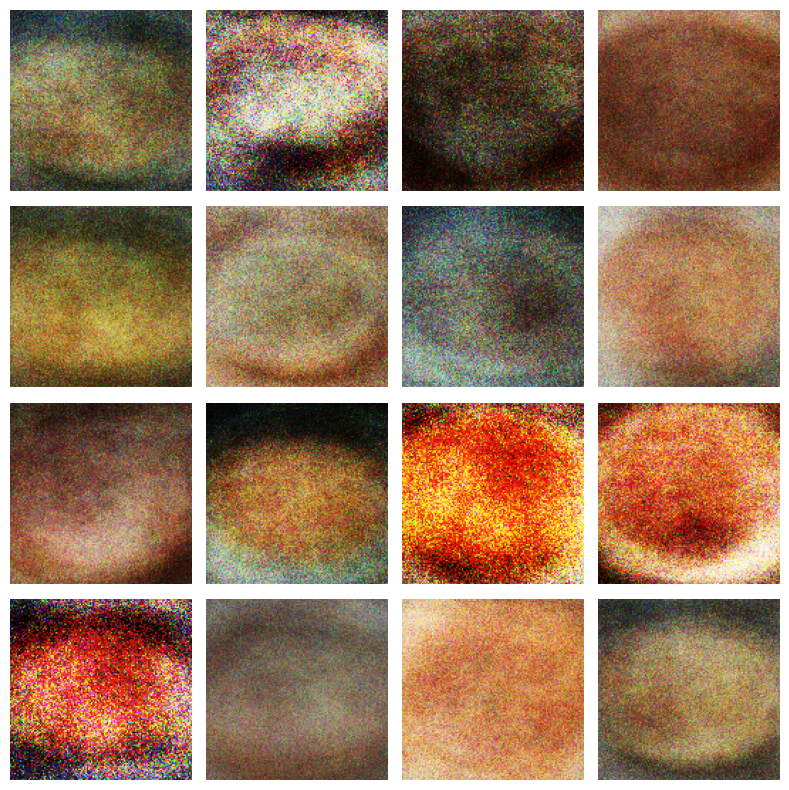

[Epoch 162/300] [Batch 0] D: 0.6257 G: 1078.0005 Real mean: -0.1590 Fake mean: -0.1501
[Epoch 163/300] [Batch 0] D: 0.6495 G: 931.1953 Real mean: -0.1953 Fake mean: -0.1460
[Epoch 164/300] [Batch 0] D: 0.6306 G: 872.4313 Real mean: -0.1362 Fake mean: -0.1531
[Epoch 165/300] [Batch 0] D: 0.5694 G: 991.9409 Real mean: -0.1209 Fake mean: -0.1628
[Epoch 166/300] [Batch 0] D: 0.6312 G: 1055.9655 Real mean: -0.2232 Fake mean: -0.1632
[Epoch 167/300] [Batch 0] D: 0.5679 G: 1248.4283 Real mean: -0.1919 Fake mean: -0.1492
[Epoch 168/300] [Batch 0] D: 0.5678 G: 1094.9122 Real mean: -0.1208 Fake mean: -0.1550
[Epoch 169/300] [Batch 0] D: 0.5875 G: 1146.4230 Real mean: -0.1792 Fake mean: -0.1610
[Epoch 170/300] [Batch 0] D: 0.5654 G: 1164.1904 Real mean: -0.0970 Fake mean: -0.1448
Чекпоинт сохранён: gan_checkpoint.pth [web:21][web:24]
[Epoch 171/300] [Batch 0] D: 0.6612 G: 1110.5326 Real mean: -0.0950 Fake mean: -0.1588
[Epoch 172/300] [Batch 0] D: 0.5837 G: 952.2741 Real mean: -0.1399 Fake mean: 

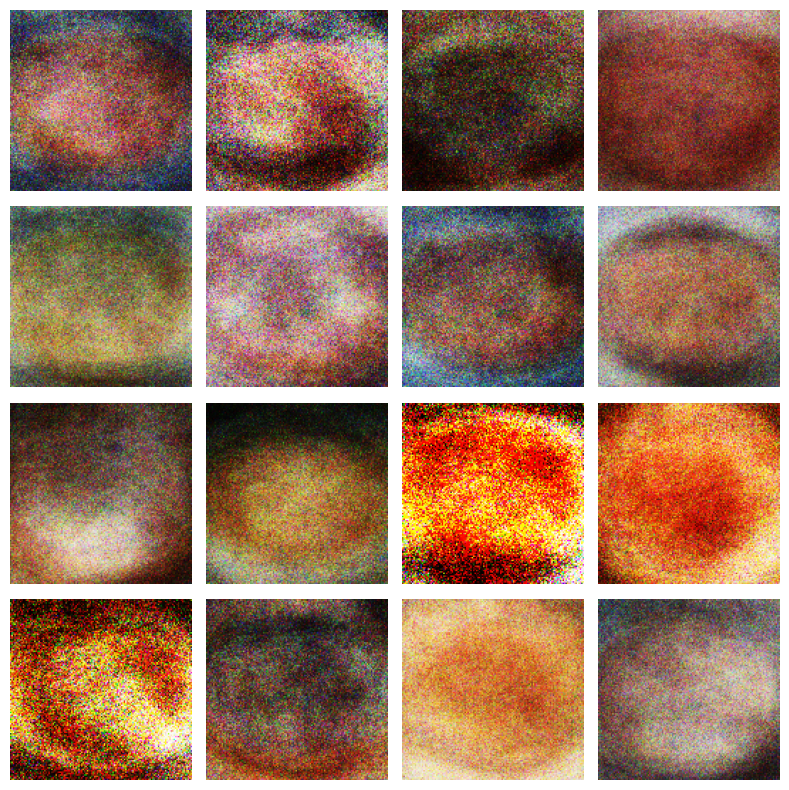

[Epoch 182/300] [Batch 0] D: 0.6035 G: 1046.6340 Real mean: -0.1727 Fake mean: -0.1536
[Epoch 183/300] [Batch 0] D: 0.5592 G: 1116.8015 Real mean: -0.1347 Fake mean: -0.1649
[Epoch 184/300] [Batch 0] D: 0.5976 G: 1143.8658 Real mean: -0.1061 Fake mean: -0.1556
[Epoch 185/300] [Batch 0] D: 0.7217 G: 1256.1960 Real mean: -0.1339 Fake mean: -0.1570
[Epoch 186/300] [Batch 0] D: 0.6165 G: 1099.2787 Real mean: -0.0817 Fake mean: -0.1506
[Epoch 187/300] [Batch 0] D: 0.6554 G: 1110.8179 Real mean: -0.1314 Fake mean: -0.1742
[Epoch 188/300] [Batch 0] D: 0.6207 G: 1062.8489 Real mean: -0.1553 Fake mean: -0.1632
[Epoch 189/300] [Batch 0] D: 0.6021 G: 1176.3186 Real mean: -0.1638 Fake mean: -0.1515
[Epoch 190/300] [Batch 0] D: 0.5647 G: 1174.1606 Real mean: -0.1161 Fake mean: -0.1565
Чекпоинт сохранён: gan_checkpoint.pth [web:21][web:24]
[Epoch 191/300] [Batch 0] D: 0.6015 G: 1409.6082 Real mean: -0.1472 Fake mean: -0.1496
[Epoch 192/300] [Batch 0] D: 0.5940 G: 1144.2117 Real mean: -0.1831 Fake me

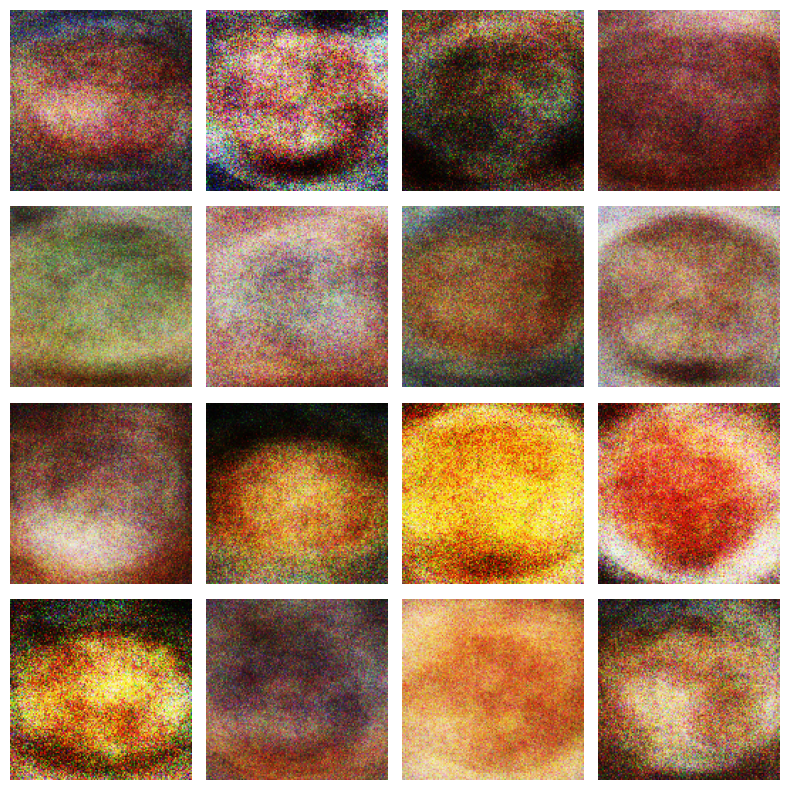

[Epoch 202/300] [Batch 0] D: 0.6937 G: 1301.8838 Real mean: -0.1802 Fake mean: -0.1624
[Epoch 203/300] [Batch 0] D: 0.6640 G: 1322.0946 Real mean: -0.0953 Fake mean: -0.1516
[Epoch 204/300] [Batch 0] D: 0.7126 G: 1252.9280 Real mean: -0.1834 Fake mean: -0.1612
[Epoch 205/300] [Batch 0] D: 0.7247 G: 1325.5237 Real mean: -0.1089 Fake mean: -0.1481
[Epoch 206/300] [Batch 0] D: 0.6627 G: 1154.8138 Real mean: -0.1661 Fake mean: -0.1567
[Epoch 207/300] [Batch 0] D: 0.6058 G: 1249.5045 Real mean: -0.1071 Fake mean: -0.1624
[Epoch 208/300] [Batch 0] D: 0.6150 G: 1395.0695 Real mean: -0.1642 Fake mean: -0.1626
[Epoch 209/300] [Batch 0] D: 0.6325 G: 1378.2657 Real mean: -0.0859 Fake mean: -0.1698
[Epoch 210/300] [Batch 0] D: 0.6573 G: 1408.8015 Real mean: -0.0993 Fake mean: -0.1664
Чекпоинт сохранён: gan_checkpoint.pth [web:21][web:24]
[Epoch 211/300] [Batch 0] D: 0.6255 G: 1314.6820 Real mean: -0.1523 Fake mean: -0.1435
[Epoch 212/300] [Batch 0] D: 0.5883 G: 1348.0657 Real mean: -0.1089 Fake me

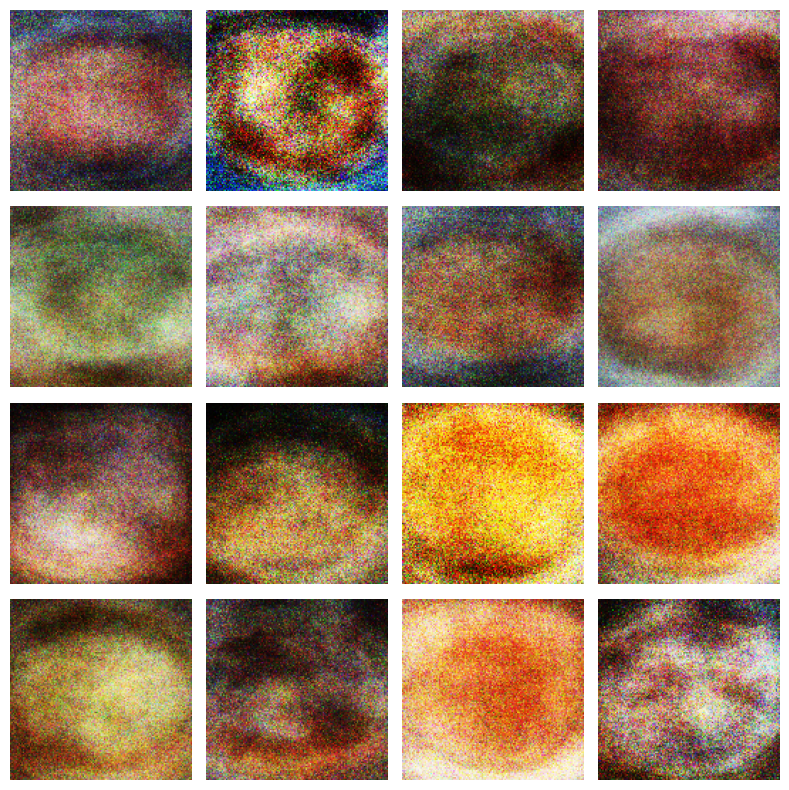

[Epoch 222/300] [Batch 0] D: 0.6611 G: 1342.2637 Real mean: -0.1668 Fake mean: -0.1538
[Epoch 223/300] [Batch 0] D: 0.6280 G: 1361.4365 Real mean: -0.1620 Fake mean: -0.1575
[Epoch 224/300] [Batch 0] D: 0.6308 G: 1446.2415 Real mean: -0.1373 Fake mean: -0.1601
[Epoch 225/300] [Batch 0] D: 0.6180 G: 1434.6221 Real mean: -0.1925 Fake mean: -0.1446
[Epoch 226/300] [Batch 0] D: 0.6310 G: 1403.7975 Real mean: -0.1128 Fake mean: -0.1499
[Epoch 227/300] [Batch 0] D: 0.6512 G: 1198.6997 Real mean: -0.1721 Fake mean: -0.1628
[Epoch 228/300] [Batch 0] D: 0.6368 G: 1463.0024 Real mean: -0.0584 Fake mean: -0.1595
[Epoch 229/300] [Batch 0] D: 0.6791 G: 1483.3029 Real mean: -0.1335 Fake mean: -0.1658
[Epoch 230/300] [Batch 0] D: 0.6356 G: 1471.3145 Real mean: -0.1337 Fake mean: -0.1644
Чекпоинт сохранён: gan_checkpoint.pth [web:21][web:24]
[Epoch 231/300] [Batch 0] D: 0.5908 G: 1519.9924 Real mean: -0.1578 Fake mean: -0.1603
[Epoch 232/300] [Batch 0] D: 0.6301 G: 1472.0145 Real mean: -0.1860 Fake me

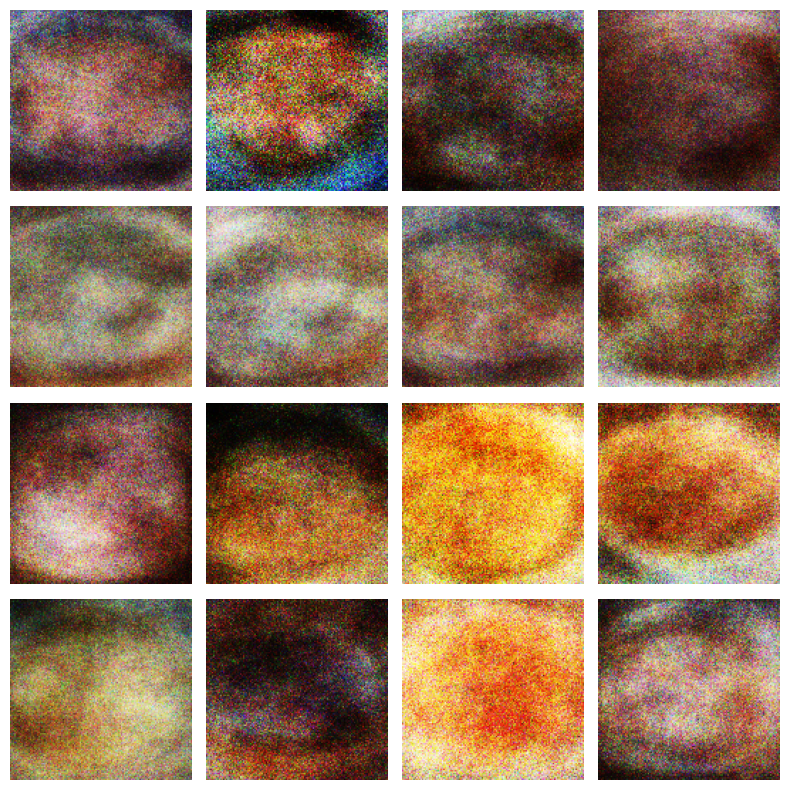

[Epoch 242/300] [Batch 0] D: 0.6017 G: 1754.2714 Real mean: -0.1791 Fake mean: -0.1677
[Epoch 243/300] [Batch 0] D: 0.6148 G: 1431.9099 Real mean: -0.1332 Fake mean: -0.1614
[Epoch 244/300] [Batch 0] D: 0.5975 G: 1643.0330 Real mean: -0.1476 Fake mean: -0.1551
[Epoch 245/300] [Batch 0] D: 0.6762 G: 1339.7975 Real mean: -0.1777 Fake mean: -0.1682
[Epoch 246/300] [Batch 0] D: 0.6374 G: 1227.2544 Real mean: -0.2273 Fake mean: -0.1622
[Epoch 247/300] [Batch 0] D: 0.6033 G: 1460.5498 Real mean: -0.1688 Fake mean: -0.1660
[Epoch 248/300] [Batch 0] D: 0.6765 G: 1460.0562 Real mean: -0.1581 Fake mean: -0.1502
[Epoch 249/300] [Batch 0] D: 0.7010 G: 1504.2948 Real mean: -0.1545 Fake mean: -0.1705
[Epoch 250/300] [Batch 0] D: 0.5981 G: 1557.6251 Real mean: -0.0541 Fake mean: -0.1511
Чекпоинт сохранён: gan_checkpoint.pth [web:21][web:24]
[Epoch 251/300] [Batch 0] D: 0.6526 G: 1470.6941 Real mean: -0.1054 Fake mean: -0.1577
[Epoch 252/300] [Batch 0] D: 0.5378 G: 1610.0330 Real mean: -0.1288 Fake me

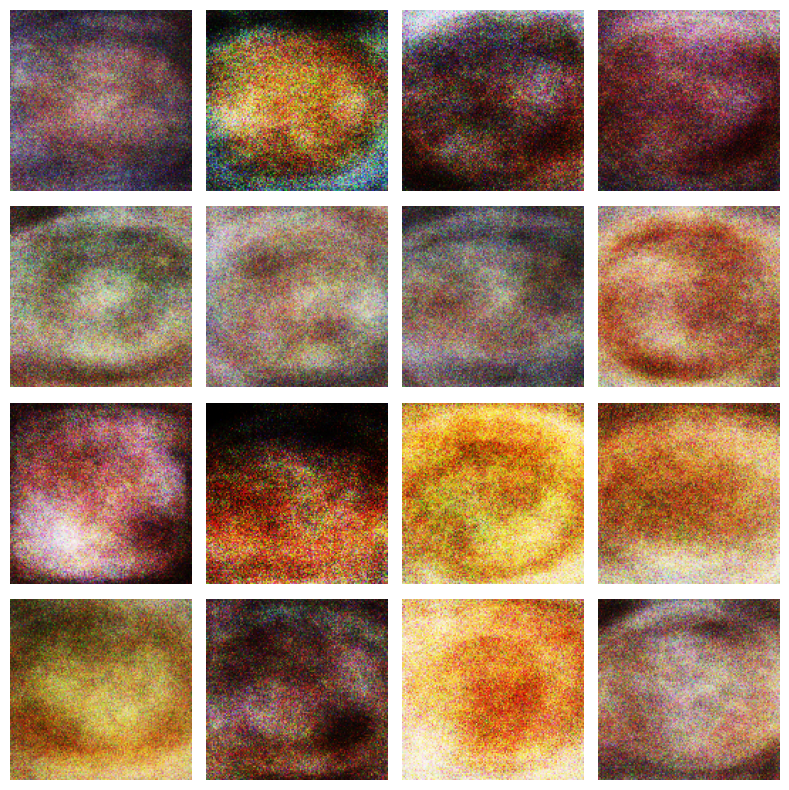

[Epoch 262/300] [Batch 0] D: 0.6300 G: 1434.4795 Real mean: -0.1715 Fake mean: -0.1579
[Epoch 263/300] [Batch 0] D: 0.6208 G: 1596.6460 Real mean: -0.1431 Fake mean: -0.1598
[Epoch 264/300] [Batch 0] D: 0.6283 G: 1591.2943 Real mean: -0.1967 Fake mean: -0.1593
[Epoch 265/300] [Batch 0] D: 0.7099 G: 1624.5684 Real mean: -0.1432 Fake mean: -0.1657
[Epoch 266/300] [Batch 0] D: 0.5996 G: 1561.6777 Real mean: -0.1107 Fake mean: -0.1683
[Epoch 267/300] [Batch 0] D: 0.6386 G: 1389.3390 Real mean: -0.1942 Fake mean: -0.1681
[Epoch 268/300] [Batch 0] D: 0.6341 G: 1827.0928 Real mean: -0.1177 Fake mean: -0.1607
[Epoch 269/300] [Batch 0] D: 0.6382 G: 1652.8506 Real mean: -0.1617 Fake mean: -0.1675
[Epoch 270/300] [Batch 0] D: 0.5826 G: 1542.9709 Real mean: -0.0825 Fake mean: -0.1551
Чекпоинт сохранён: gan_checkpoint.pth [web:21][web:24]
[Epoch 271/300] [Batch 0] D: 0.5908 G: 1739.6414 Real mean: -0.1826 Fake mean: -0.1583
[Epoch 272/300] [Batch 0] D: 0.6837 G: 1695.3492 Real mean: -0.1362 Fake me

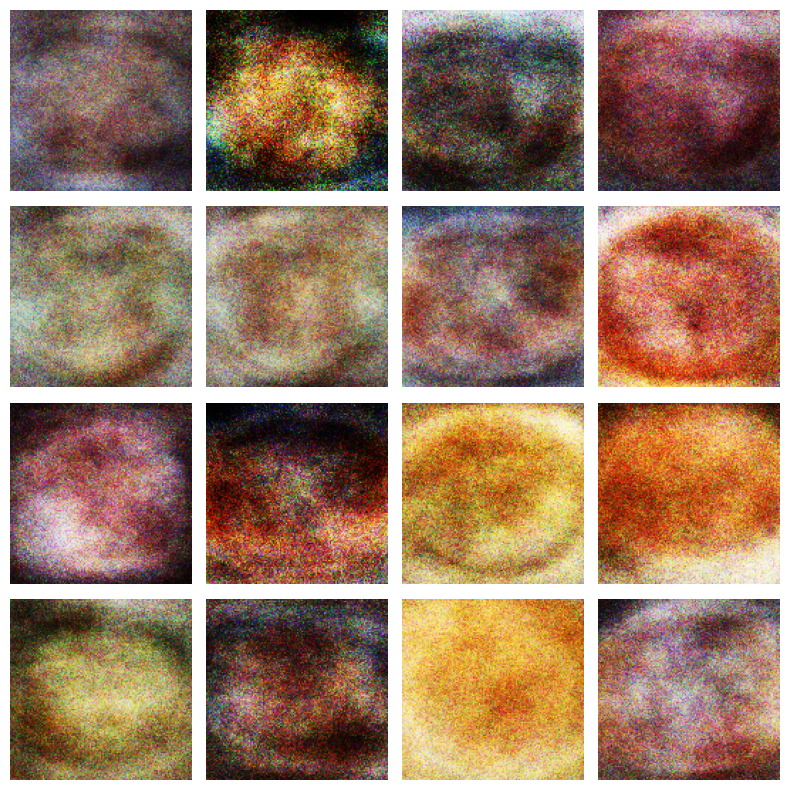

[Epoch 282/300] [Batch 0] D: 0.6416 G: 1579.4434 Real mean: -0.1485 Fake mean: -0.1517
[Epoch 283/300] [Batch 0] D: 0.6309 G: 1654.5696 Real mean: -0.1334 Fake mean: -0.1590
[Epoch 284/300] [Batch 0] D: 0.5656 G: 1606.2980 Real mean: -0.1601 Fake mean: -0.1607
[Epoch 285/300] [Batch 0] D: 0.6025 G: 1595.8009 Real mean: -0.1290 Fake mean: -0.1519
[Epoch 286/300] [Batch 0] D: 0.6657 G: 1600.0785 Real mean: -0.1200 Fake mean: -0.1643
[Epoch 287/300] [Batch 0] D: 0.5925 G: 1570.6243 Real mean: -0.1447 Fake mean: -0.1221
[Epoch 288/300] [Batch 0] D: 0.6410 G: 1963.0743 Real mean: -0.0751 Fake mean: -0.1649
[Epoch 289/300] [Batch 0] D: 0.5852 G: 1668.3375 Real mean: -0.1223 Fake mean: -0.1552
[Epoch 290/300] [Batch 0] D: 0.6606 G: 1547.0378 Real mean: -0.1694 Fake mean: -0.1640
Чекпоинт сохранён: gan_checkpoint.pth [web:21][web:24]
[Epoch 291/300] [Batch 0] D: 0.6285 G: 1577.1675 Real mean: -0.2168 Fake mean: -0.1668
[Epoch 292/300] [Batch 0] D: 0.5935 G: 1512.4154 Real mean: -0.1025 Fake me

In [10]:
for epoch in range(start_epoch, num_epochs):
    for i, real_imgs in enumerate(dataloader):
        real_imgs = real_imgs.to(device).view(batch_size, -1)
        valid = torch.full((batch_size, 1), 0.9, device=device)
        fake_label = torch.full((batch_size, 1), 0.1, device=device)

        #D
        z = torch.randn(batch_size, latent_dim, device=device)
        fake_imgs = generator(z)

        real_loss = criterion(discriminator(real_imgs), valid)
        fake_loss = criterion(discriminator(fake_imgs.detach()), fake_label)
        d_loss = (real_loss + fake_loss) / 2

        optimizer_D.zero_grad()
        d_loss.backward()
        optimizer_D.step()

        #G
        fake_imgs = generator(z)
        bce_g_loss = criterion(discriminator(fake_imgs), valid)

        feat_real = discriminator[0:3](real_imgs)
        feat_fake = discriminator[0:3](fake_imgs)
        fm_loss = F.mse_loss(feat_real, feat_fake.detach())

        g_loss = bce_g_loss + 10 * fm_loss

        optimizer_G.zero_grad()
        g_loss.backward()
        optimizer_G.step()

        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())

        if i % 200 == 0:
            print(f"[Epoch {epoch+1}/{num_epochs}] [Batch {i}] "
                  f"D: {d_loss:.4f} G: {g_loss:.4f} "
                  f"Real mean: {real_imgs.mean():.4f} Fake mean: {fake_imgs.mean():.4f}")

    # Сохранение чекпоинта каждые 10 эпох
    if (epoch + 1) % 10 == 0:
        checkpoint = {
            'epoch': epoch + 1,
            'generator_state': generator.state_dict(),
            'discriminator_state': discriminator.state_dict(),
            'optimizer_G_state': optimizer_G.state_dict(),
            'optimizer_D_state': optimizer_D.state_dict(),
            'd_losses': d_losses,
            'g_losses': g_losses,
            'fixed_z': fixed_z
        }
        torch.save(checkpoint, checkpoint_path)
        print(f"Чекпоинт сохранён: {checkpoint_path}")

    if epoch % 20 == 0:
        print(f"Epoch {epoch+1} samples:")
        generate_and_show(generator, fixed_z)
        torch.save(generator.state_dict(), f'generator.pth')


Результаты обучения

Загружен gan_checkpoint.pth: generator + fixed_z + losses (epoch 300)


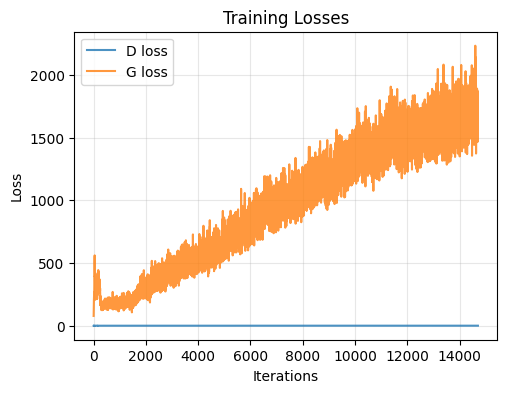

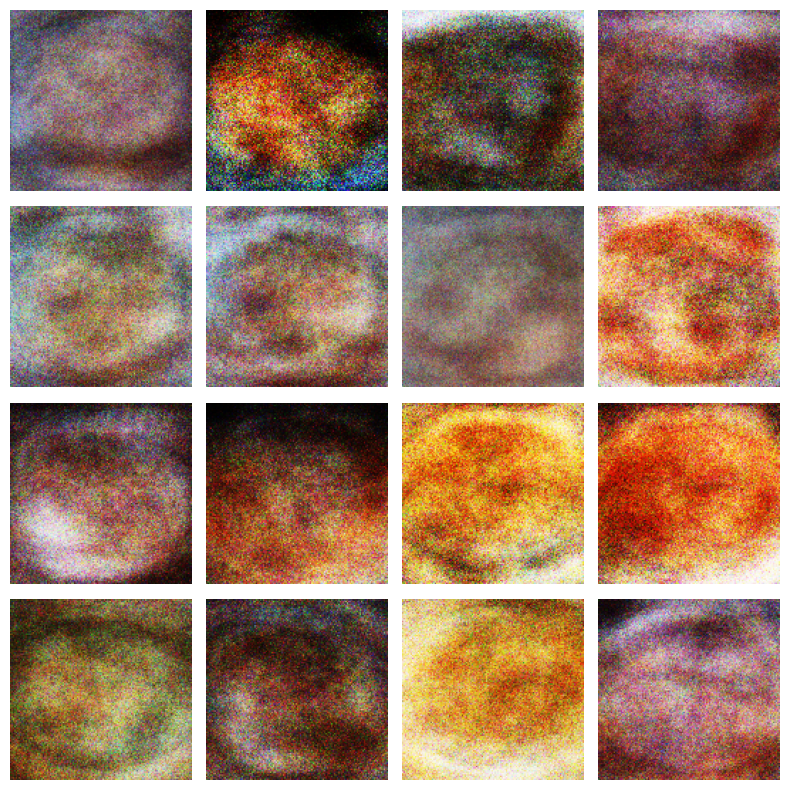

In [12]:
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    generator.load_state_dict(checkpoint['generator_state'])

    if 'fixed_z' in checkpoint:
        fixed_z = checkpoint['fixed_z']
    if 'd_losses' in checkpoint:
        d_losses = checkpoint['d_losses']
    if 'g_losses' in checkpoint:
        g_losses = checkpoint['g_losses']

    print(f"Загружен gan_checkpoint.pth: generator + fixed_z + losses (epoch {checkpoint.get('epoch', 'N/A')})")
else:
    print("gan_checkpoint.pth не найден")

generator.eval()

if len(d_losses) > 0 and len(g_losses) > 0:
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(d_losses, label='D loss', alpha=0.8)
    plt.plot(g_losses, label='G loss', alpha=0.8)
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.title('Training Losses')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

generate_and_show(generator, fixed_z)